# EDA the simulation results of slurp
ggplot default setting handles the datetime poorly 
use matplotlib to do EDA

In [1]:
#load packages
import sqlite3
import re
import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math

In [2]:
# Build connection with db
con = sqlite3.connect('../../03processed-data/Richard.sqlite3')
mycur = con.cursor() 
mycur.execute("SELECT name FROM sqlite_master WHERE type='table' ORDER BY name;")
(mycur.fetchall())

[('ES',),
 ('Phenology',),
 ('SoilWater',),
 ('SowingDates',),
 ('biomass',),
 ('met_AshleyDene',),
 ('met_Iversen12',),
 ('root',)]

In [3]:
water = pd.read_sql('Select * from SoilWater',  con)

In [4]:
water['Clock.Today'] = pd.to_datetime(water['Clock.Today'])
water.set_index('Clock.Today', inplace=True)

In [5]:
water.columns

Index(['Experiment', 'Season', 'SowingDate', 'Rep', 'Plot', 'Seed', 'DAS',
       'SW(1)', 'SW(2)', 'SW(3)', 'SW(4)', 'SW(5)', 'SW(6)', 'SW(7)', 'SW(8)',
       'SW(9)', 'SW(10)', 'SW(11)', 'SW(12)', 'SW(13)', 'SW(14)', 'SW(15)',
       'SW(16)', 'SW(17)', 'SW(18)', 'SW(19)', 'SW(20)', 'SW(21)', 'SW(22)',
       'SW(23)', 'SWC'],
      dtype='object')

In [6]:
water_mean = water.groupby(['Experiment', 'SowingDate','Clock.Today']).mean()

In [7]:
water_mean

Rep   Plot    DAS   SW(1)   SW(2)  \
Experiment SowingDate Clock.Today                                      
AshleyDene SD1        2010-11-09   2.5  40.75   19.0  20.400  20.400   
                      2010-11-16   2.5  40.75   26.0  16.925  16.925   
                      2010-11-24   2.5  40.75   34.0  17.125  17.125   
                      2010-12-02   2.5  40.75   42.0  14.425  14.425   
                      2010-12-13   2.5  40.75   53.0  11.900  11.900   
...                                ...    ...    ...     ...     ...   
Iversen12  SD9        2012-04-21   2.5  94.50  102.0  25.400  25.400   
                      2012-05-08   2.5  94.50  119.0  20.950  20.950   
                      2012-05-24   2.5  94.50  135.0  19.300  19.300   
                      2012-06-05   2.5  94.50  147.0  25.875  25.875   
                      2012-06-21   2.5  94.50  163.0  34.150  34.150   

                                       SW(3)      SW(4)      SW(5)      SW(6)  \
Experiment SowingDate Clock.Today                                               
AshleyDene SD1        2010-11-09   16.800000  13.375000  10.987500  10.237500   
                      2010-11-16   16.800000  13.375000  10.987500  10.237500   
                      2010-11-24   17.025000  13.725000  11.050000  10.400000   
                      2010-12-02   16.575000  13.025000  10.925000  10.075000   
                      2010-12-13   13.275000  11.850000  10.900000   9.950000   
...                                      ...        ...        ...        ...   
Iversen12  SD9        2012-04-21   26.254657  22.942198  20.440130  19.109241   
                      2012-05-08   25.634125  22.564773  19.718087  18.871185   
                      2012-05-24   25.260629  22.314521  19.986812  18.433114   
                      2012-06-05   28.563366  25.290939  22.821079  20.972857   
                      2012-06-21   31.822863  28.232970  25.622723  23.485736   

                                       SW(7)  ...     SW(15)     SW(16)  \
Experiment SowingDate Clock.Today             ...                         
AshleyDene SD1        2010-11-09    9.837500  ...  10.612500  11.437500   
                      2010-11-16    9.837500  ...  10.612500  11.437500   
                      2010-11-24    9.725000  ...  11.612500  11.887500   
                      2010-12-02    9.950000  ...  11.012500  11.987500   
                      2010-12-13    9.725000  ...  10.712500  12.287500   
...                                      ...  ...        ...        ...   
Iversen12  SD9        2012-04-21   20.937887  ...  22.081516  25.143011   
                      2012-05-08   20.269419  ...  21.530166  24.371296   
                      2012-05-24   17.943447  ...  20.784680  24.192826   
                      2012-06-05   20.132163  ...  20.528106  23.978534   
                      2012-06-21   22.298482  ...  20.271084  23.763992   

                                      SW(17)     SW(18)     SW(19)     SW(20)  \
Experiment SowingDate Clock.Today                                               
AshleyDene SD1        2010-11-09   11.700000  11.150000  10.937500  10.987500   
                      2010-11-16   11.700000  11.150000  10.937500  10.987500   
                      2010-11-24   12.400000  11.750000  11.487500  11.237500   
                      2010-12-02   12.100000  11.350000  11.687500  11.337500   
                      2010-12-13   12.000000  11.350000  11.487500  10.837500   
...                                      ...        ...        ...        ...   
Iversen12  SD9        2012-04-21   28.141839  29.399994  30.644095  31.019133   
                      2012-05-08   27.151535  28.662716  30.155653  30.765534   
                      2012-05-24   27.524950  28.857776  30.176539  30.653047   
                      2012-06-05   27.350832  28.776708  30.186842  30.724779   
                      2012-06-21   27.176444  28.695477  30.196976  30.796433   

              

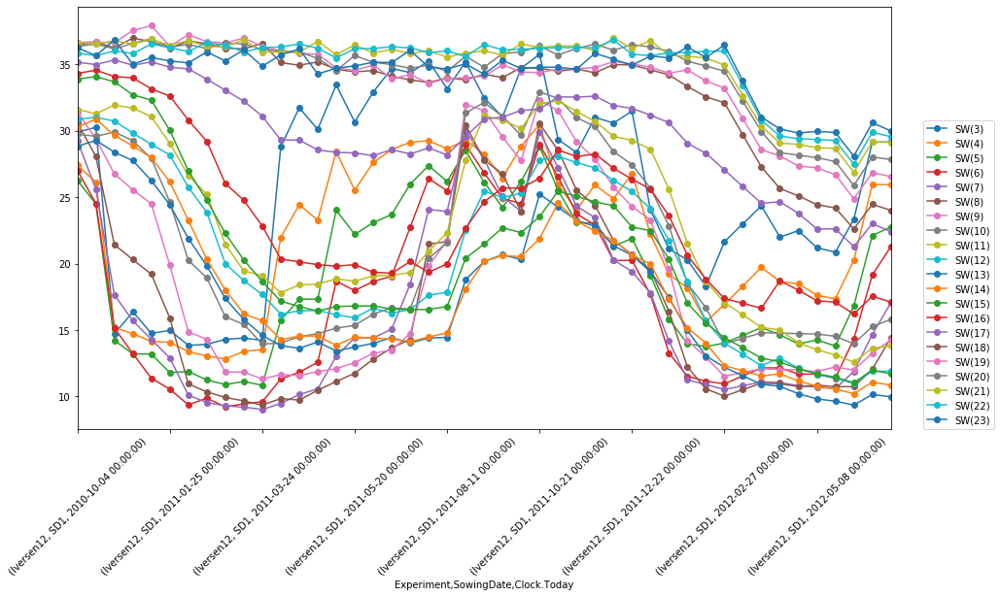

In [8]:
idx = pd.IndexSlice
water_mean.loc[idx["Iversen12","SD1",:],
          [X for X in water_mean.columns if X in ( 'SW(3)', 'SW(4)', 'SW(5)', 'SW(6)', 'SW(7)', 'SW(8)',
       'SW(9)', 'SW(10)', 'SW(11)', 'SW(12)', 'SW(13)', 'SW(14)', 'SW(15)',
       'SW(16)', 'SW(17)', 'SW(18)', 'SW(19)', 'SW(20)', 'SW(21)', 'SW(22)',
       'SW(23)')]].\
plot(figsize=(15, 8),style='o-')
plt.xticks( rotation=45)
plt.legend(loc=(1.04,0))

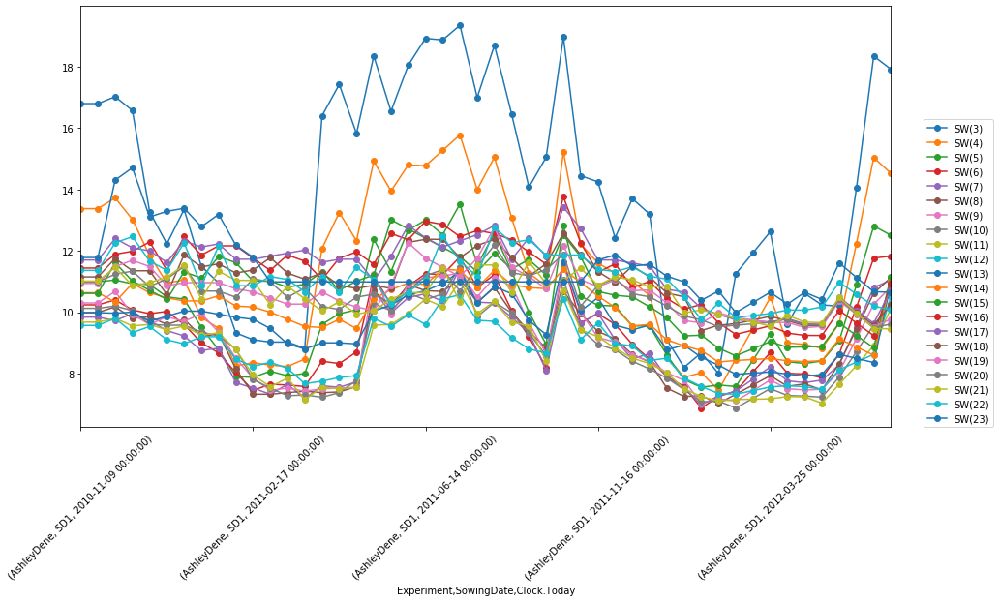

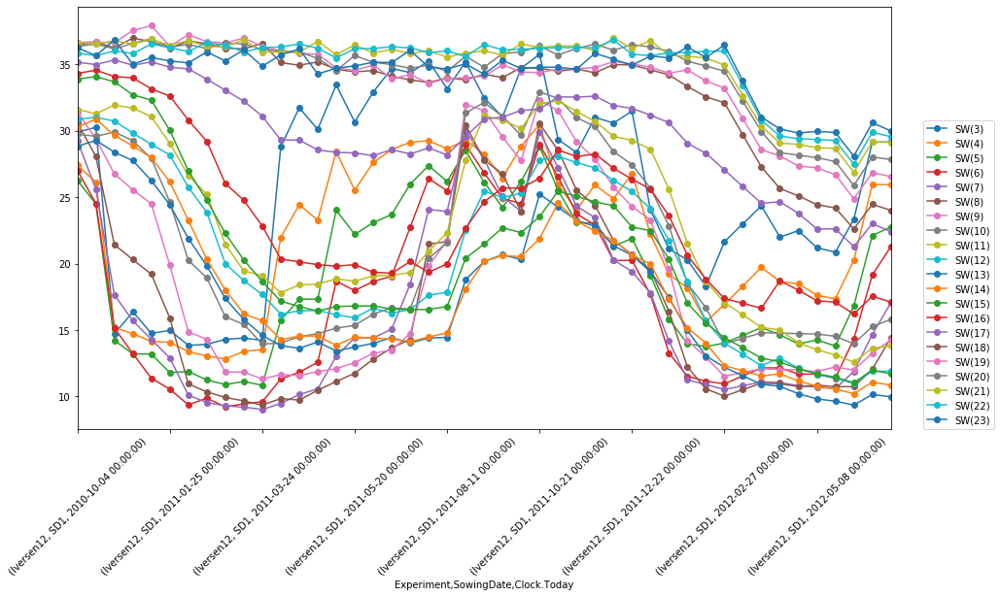

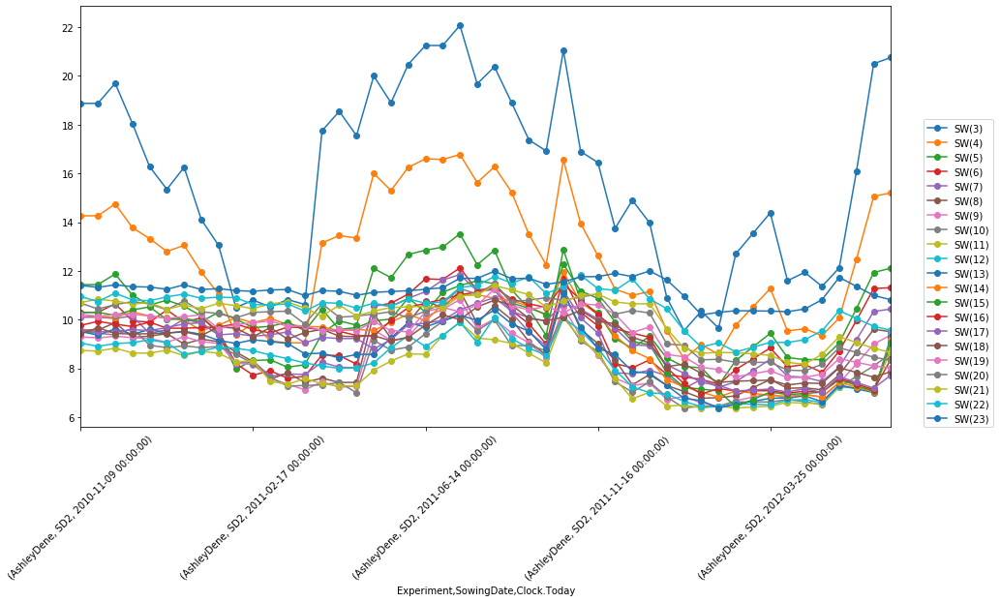

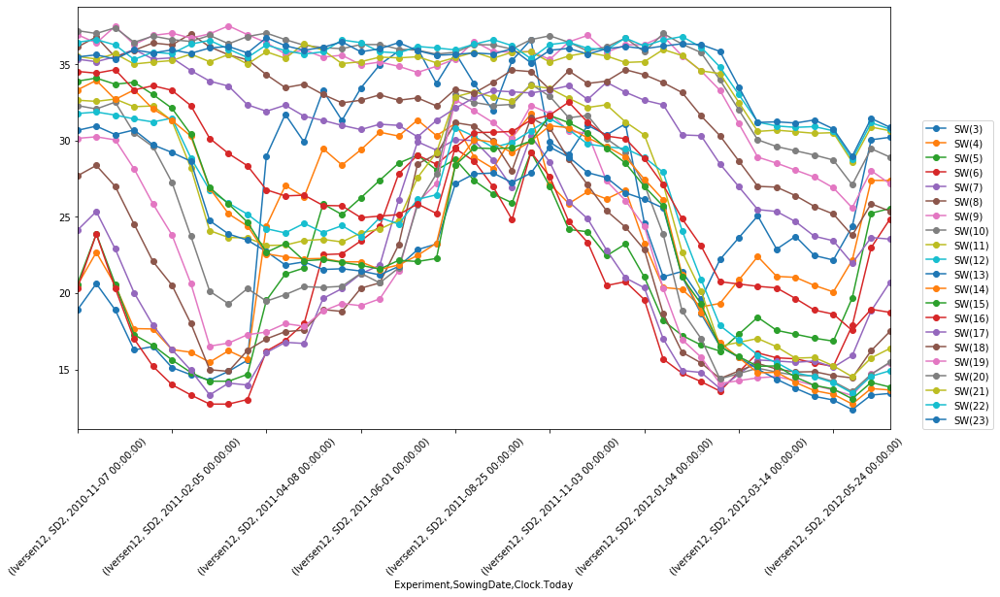

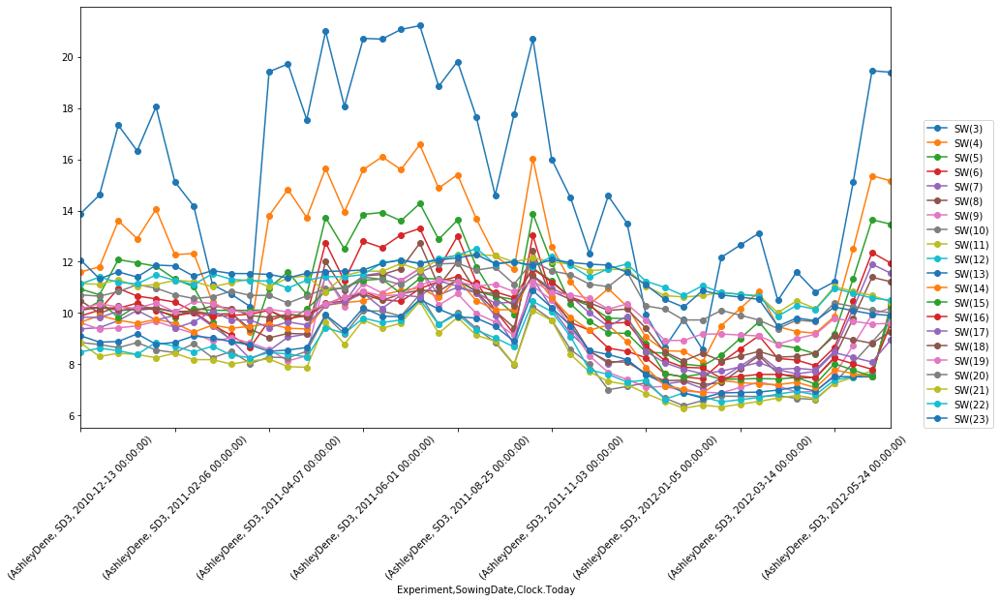

...

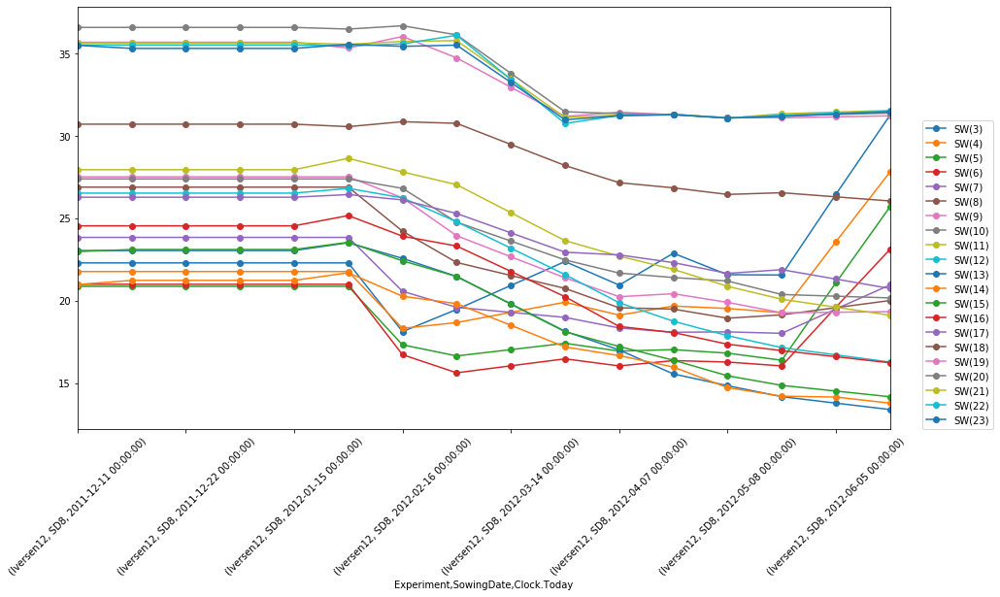

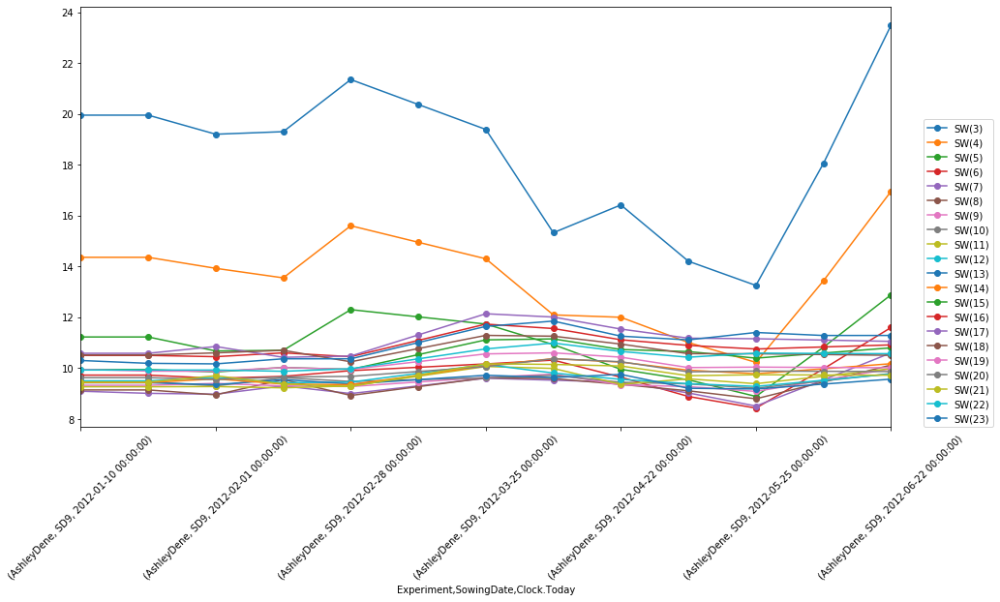

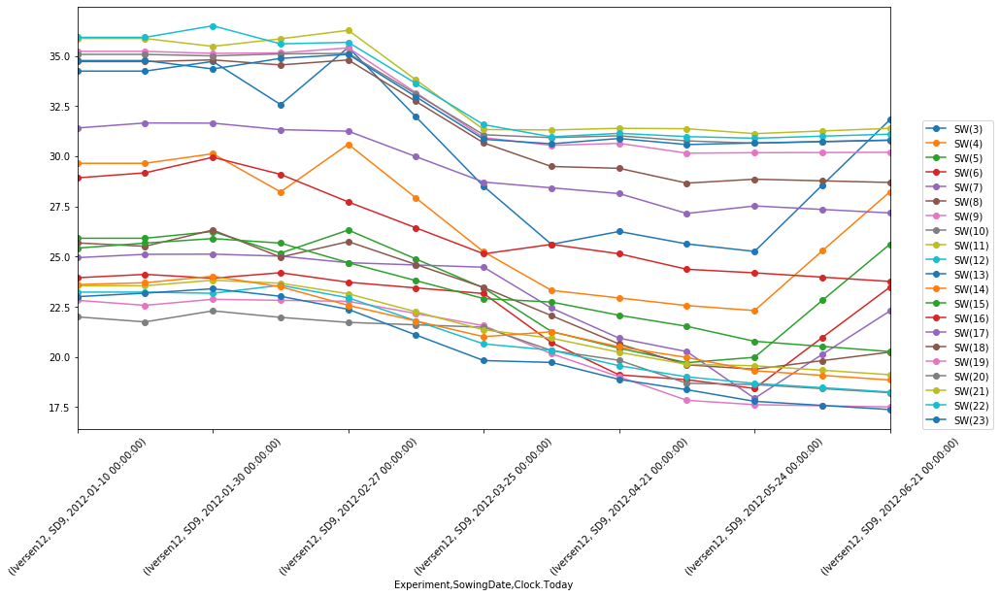

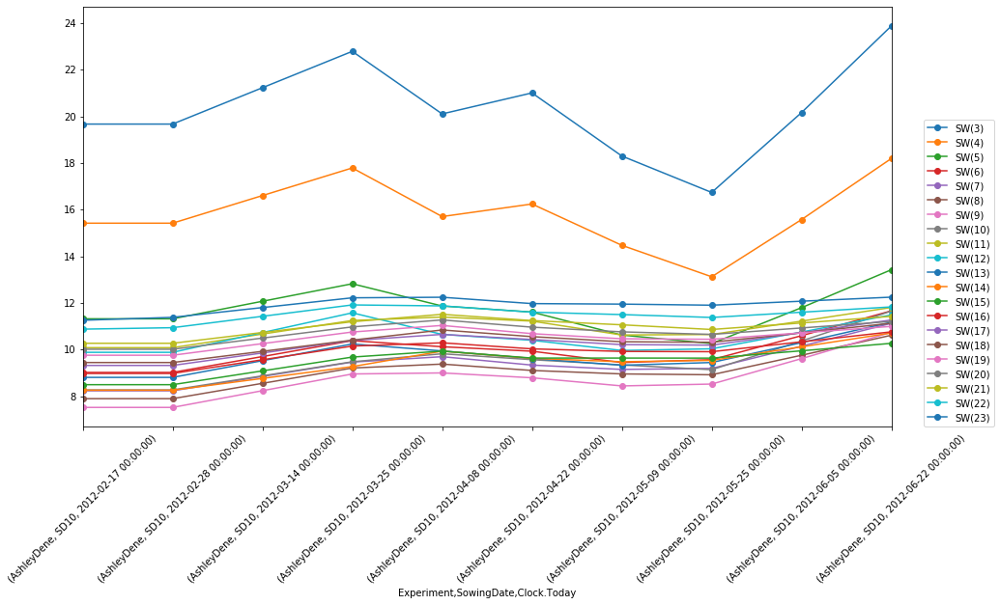

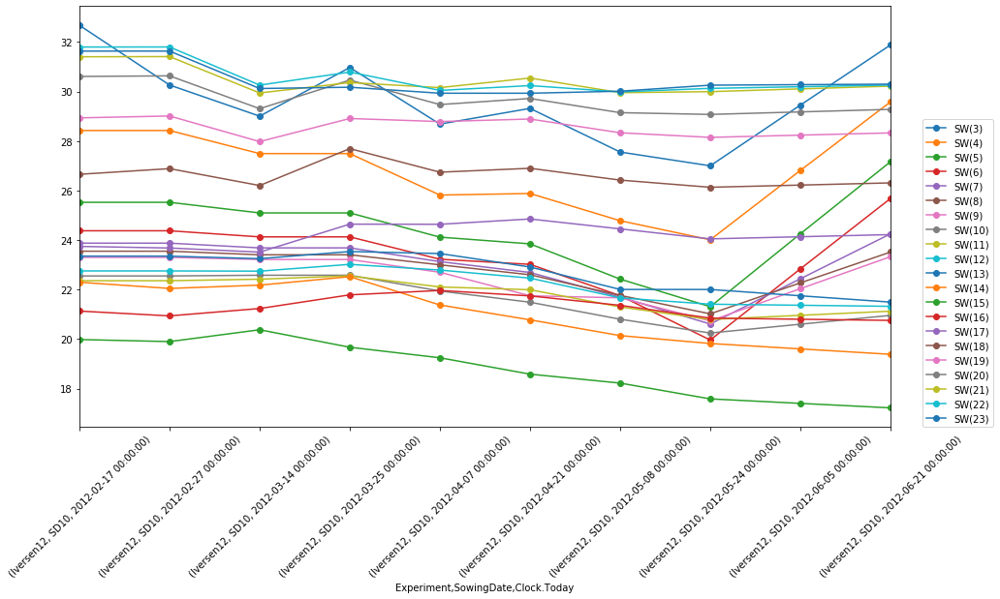

In [9]:
SDs = ['SD' + str(SD) for SD in range(1, 11)]
Sites = ['AshleyDene', 'Iversen12']
for i in SDs:
    for j in Sites:
        idx = pd.IndexSlice
        water_mean.loc[idx[j,i,:],
          [X for X in water_mean.columns if X in ( 'SW(3)', 'SW(4)', 'SW(5)', 'SW(6)', 'SW(7)', 'SW(8)',
       'SW(9)', 'SW(10)', 'SW(11)', 'SW(12)', 'SW(13)', 'SW(14)', 'SW(15)',
       'SW(16)', 'SW(17)', 'SW(18)', 'SW(19)', 'SW(20)', 'SW(21)', 'SW(22)',
       'SW(23)')]].\
        plot(figsize=(15, 8),style='o-')
        plt.xticks( rotation=45)
        plt.legend(loc=(1.04,0))

### Sowing date 9 and 10 are not really useful 

In [10]:
cols = ['SW(' + str(layer) + ')' for layer in range(1, 24)]

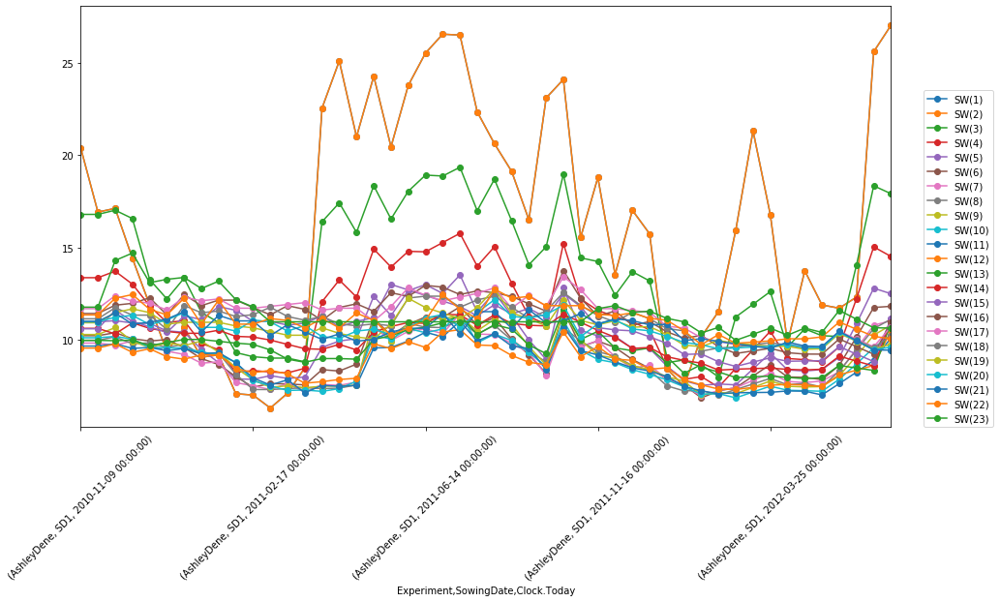

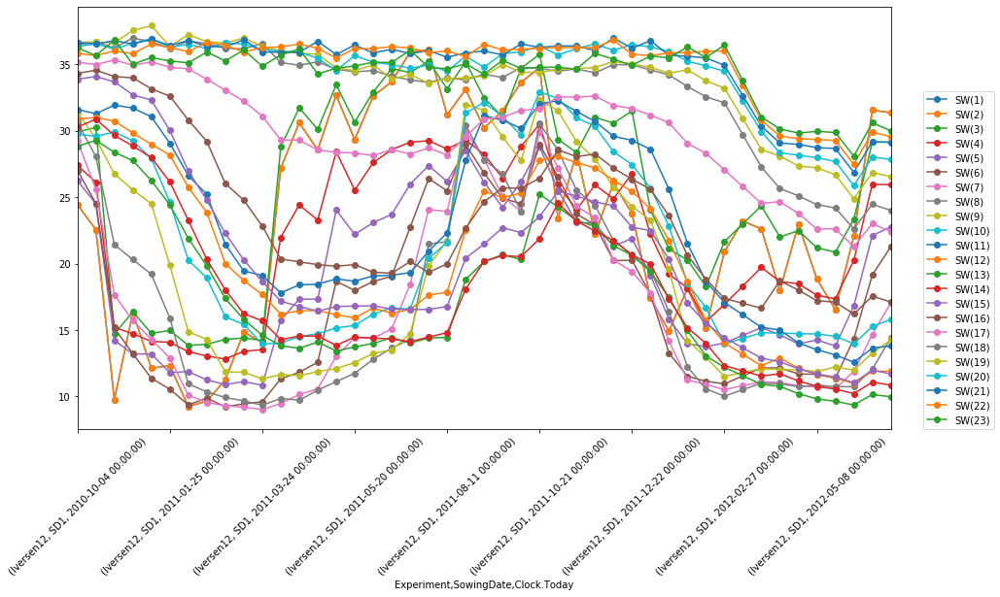

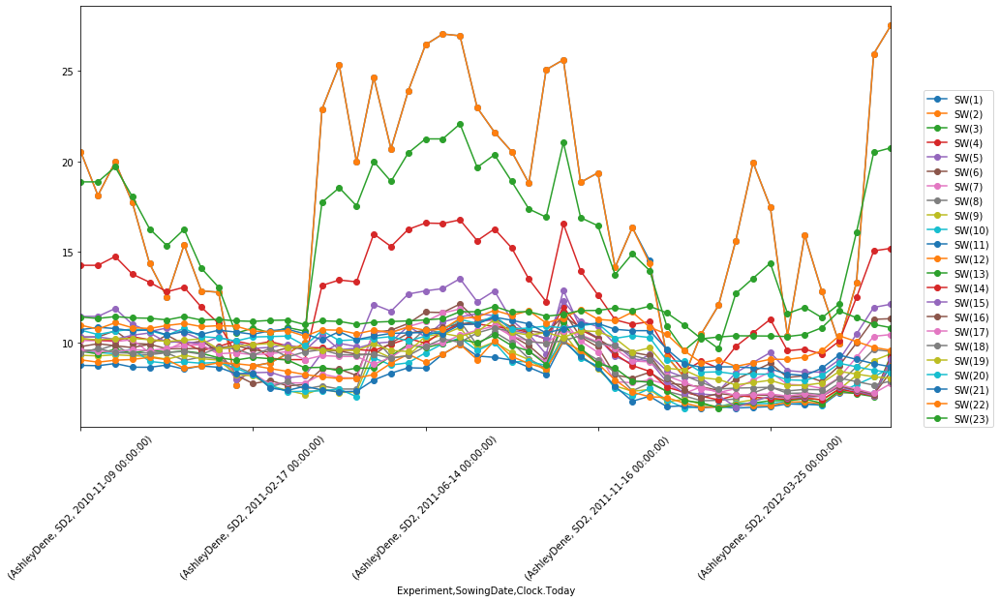

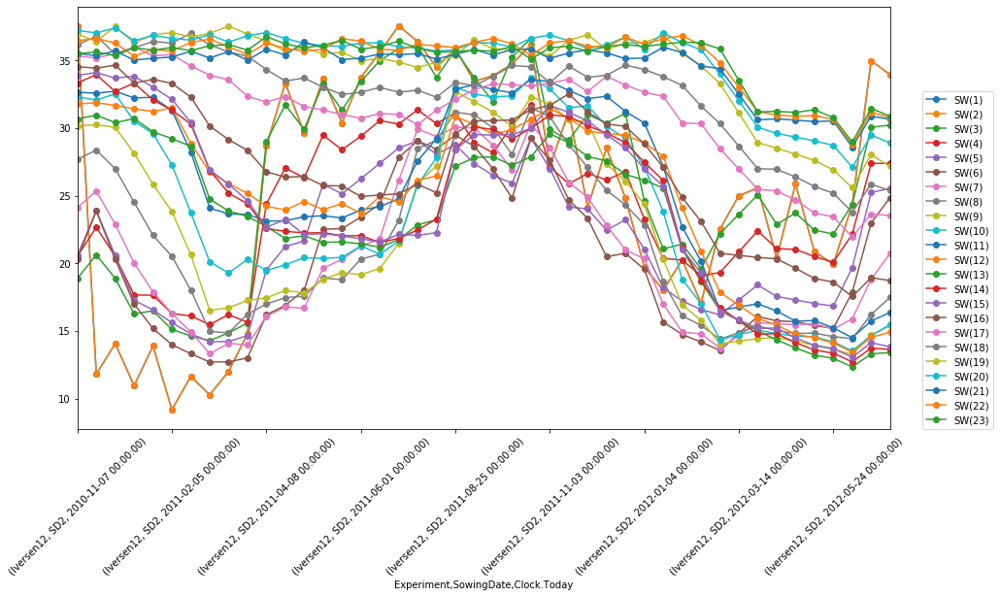

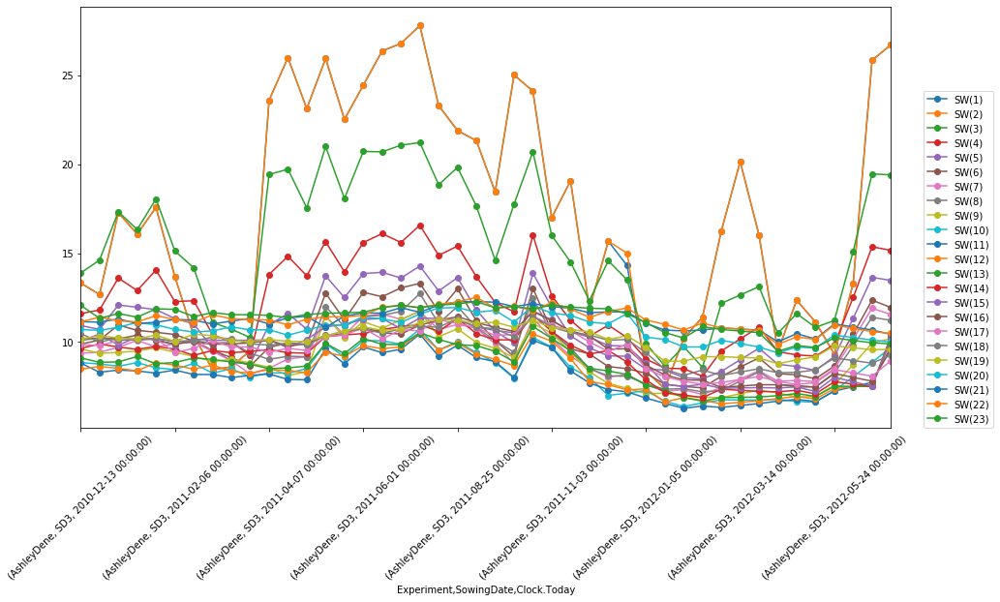

...

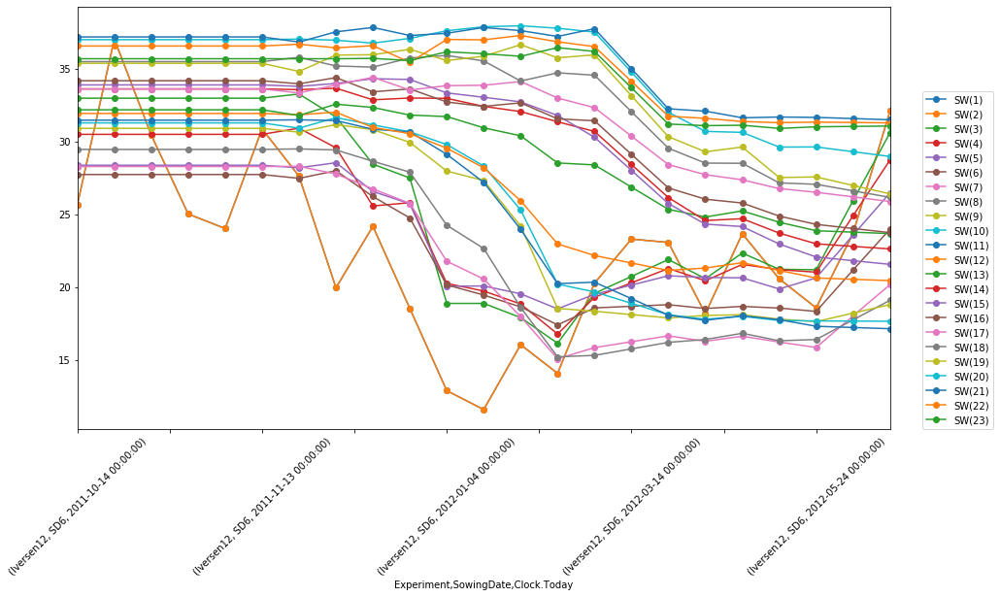

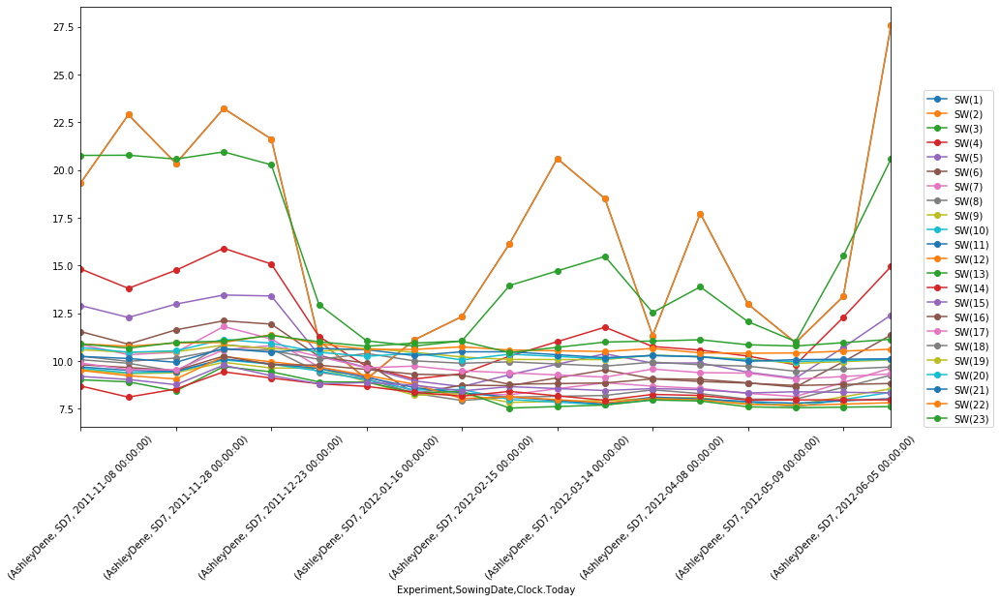

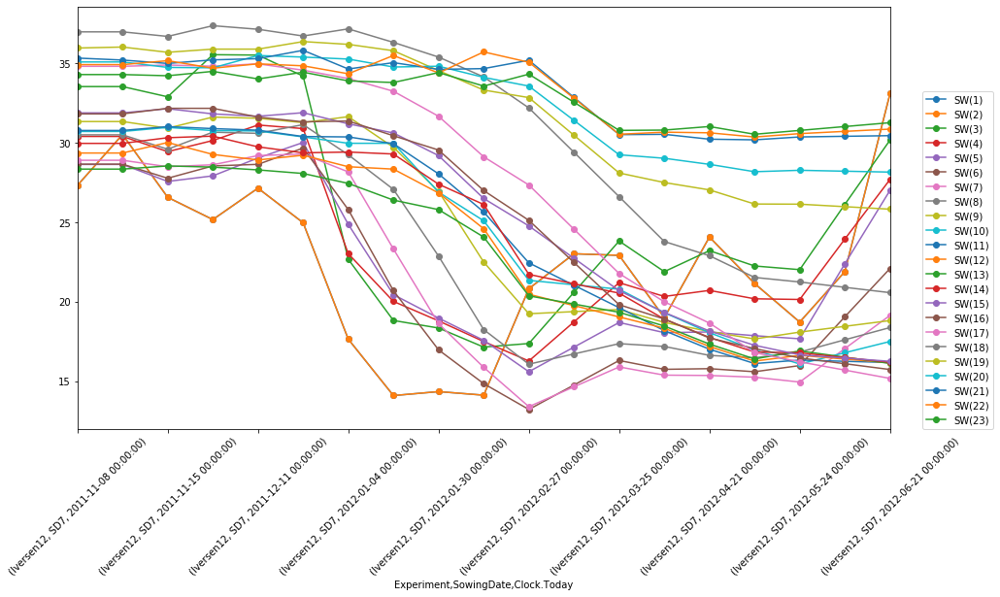

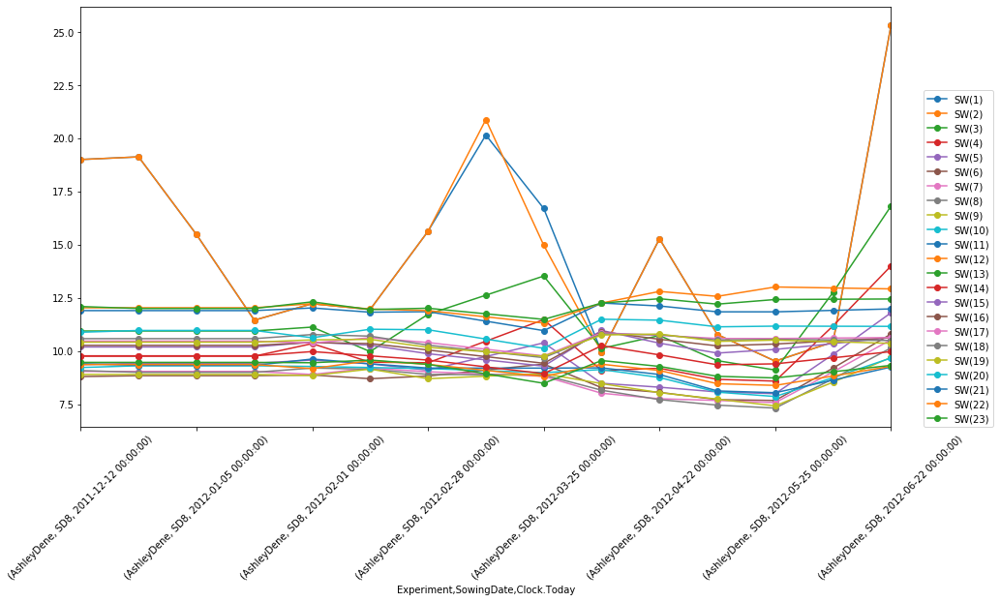

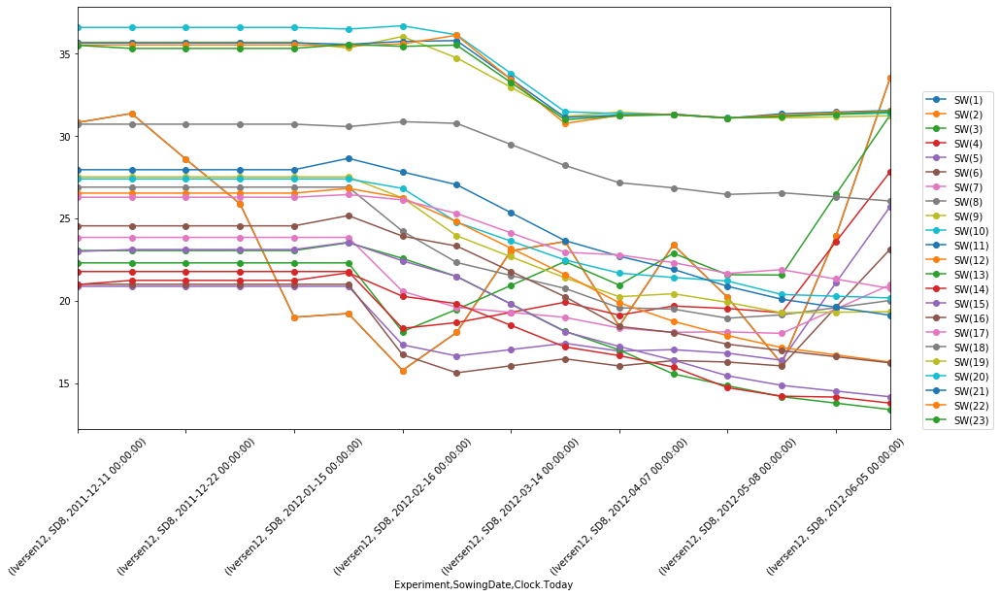

In [11]:
SDs = ['SD' + str(SD) for SD in range(1, 9)]
Sites = ['AshleyDene', 'Iversen12']
for i in SDs:
    for j in Sites:
        idx = pd.IndexSlice
        water_mean.loc[idx[j,i,:],
          [X for X in cols]].\
        plot(figsize=(15, 8),style='o-')
        plt.xticks( rotation=45)
        plt.legend(loc=(1.04,0))

### Group then found out the DUL and LL

In [12]:
DUL = water_mean.groupby(['Experiment','SowingDate']).apply(max)

In [13]:
DUL.head()

Rep   Plot    DAS   SW(1)   SW(2)      SW(3)  \
Experiment SowingDate                                                 
AshleyDene SD1         2.5  40.75  630.0  27.025  27.025  19.350000   
           SD10        2.5  98.50  610.0  28.425  28.425  23.882791   
           SD2         2.5  42.50  611.0  27.525  27.525  22.075000   
           SD3         2.5  40.00  582.0  27.800  27.800  21.225000   
           SD4         2.5  40.00  546.0  30.000  30.000  24.275000   

                           SW(4)      SW(5)      SW(6)      SW(7)  ...  \
Experiment SowingDate                                              ...   
AshleyDene SD1         15.775000  13.525000  11.826762  11.425000  ...   
           SD10        18.199897  13.430111  11.666624  11.132802  ...   
           SD2         16.775000  13.525000  12.125000  11.850000  ...   
           SD3         16.575000  14.275000  13.300000  11.906675  ...   
           SD4         18.125000  15.125000  12.925000  11.950000  ...   

                          SW(15)     SW(16)     SW(17)     SW(18)     SW(19)  \
Experiment SowingDate                                                          
AshleyDene SD1         13.012500  13.762500  13.425000  12.575000  12.762500   
           SD10        10.272979  10.765964  11.275068  11.135722  11.040135   
           SD2         12.275000  11.450000  10.900000  10.800000  11.250000   
           SD3         11.750000  11.725000  11.450000  11.441667  11.297222   
           SD4         11.662500  11.579167  11.995833  12.225000  12.325000   

                          SW(20)     SW(21)     SW(22)     SW(23)         SWC  
Experiment SowingDate                                                          
AshleyDene SD1         12.187500  11.637500  12.762500  14.706250  306.204167  
           SD10        11.276559  11.517049  11.919983  12.253568  314.575825  
           SD2         11.475000  11.400000  11.825000  12.000000  301.900000  
           SD3         12.026852  12.276543  12.521039  12.278361  312.406222  
           SD4         12.200000  11.666760  11.740636  11.820956  322.095833  

[5 rows x 27 columns]

In [14]:
water_mean.head()

Rep   Plot   DAS   SW(1)   SW(2)   SW(3)  \
Experiment SowingDate Clock.Today                                             
AshleyDene SD1        2010-11-09   2.5  40.75  19.0  20.400  20.400  16.800   
                      2010-11-16   2.5  40.75  26.0  16.925  16.925  16.800   
                      2010-11-24   2.5  40.75  34.0  17.125  17.125  17.025   
                      2010-12-02   2.5  40.75  42.0  14.425  14.425  16.575   
                      2010-12-13   2.5  40.75  53.0  11.900  11.900  13.275   

                                    SW(4)    SW(5)    SW(6)   SW(7)  ...  \
Experiment SowingDate Clock.Today                                    ...   
AshleyDene SD1        2010-11-09   13.375  10.9875  10.2375  9.8375  ...   
                      2010-11-16   13.375  10.9875  10.2375  9.8375  ...   
                      2010-11-24   13.725  11.0500  10.4000  9.7250  ...   
                      2010-12-02   13.025  10.9250  10.0750  9.9500  ...   
                      2010-12-13   11.850  10.9000   9.9500  9.7250  ...   

                                    SW(15)   SW(16)  SW(17)  SW(18)   SW(19)  \
Experiment SowingDate Clock.Today                                              
AshleyDene SD1        2010-11-09   10.6125  11.4375    11.7   11.15  10.9375   
                      2010-11-16   10.6125  11.4375    11.7   11.15  10.9375   
                      2010-11-24   11.6125  11.8875    12.4   11.75  11.4875   
                      2010-12-02   11.0125  11.9875    12.1   11.35  11.6875   
                      2010-12-13   10.7125  12.2875    12.0   11.35  11.4875   

                                    SW(20)   SW(21)   SW(22)    SW(23)  \
Experiment SowingDate Clock.Today                                        
AshleyDene SD1        2010-11-09   10.9875  11.0125  11.3625  11.78125   
                      2010-11-16   10.9875  11.0125  11.3625  11.78125   
                      2010-11-24   11.2375  11.4625  12.2625  14.30625   
                      2010-12-02   11.3375  10.8625  12.4625  14.70625   
                      2010-12-13   10.8375  10.9625  11.6625  13.10625   

                                          SWC  
Experiment SowingDate Clock.Today              
AshleyDene SD1        2010-11-09   273.289583  
                      2010-11-16   266.339583  
                      2010-11-24   275.531250  
                      2010-12-02   266.497917  
                      2010-12-13   252.422917  

[5 rows x 27 columns]

In [15]:
water_meanLONG = water_mean.reset_index().melt(id_vars= ['Experiment','SowingDate','Clock.Today','DAS'], value_vars=cols)
DUL_LONG = DUL.reset_index().melt(id_vars= ['Experiment','SowingDate'], value_vars=cols)

In [16]:
relativeSW = water_meanLONG.merge(DUL_LONG, left_on=['Experiment','SowingDate','variable'],
                                  right_on=['Experiment','SowingDate', 'variable'])

In [17]:
relativeSW['relativeSW'] = relativeSW['value_x'] / relativeSW['value_y']

In [18]:
df = relativeSW.pivot_table(values='relativeSW', index=['Experiment','SowingDate', 'Clock.Today','DAS'], 
                       columns='variable')

In [19]:
df.columns
df

variable                                    SW(1)    SW(10)    SW(11)  \
Experiment SowingDate Clock.Today DAS                                   
AshleyDene SD1        2010-11-09  19.0   0.754857  0.882353  0.877551   
                      2010-11-16  26.0   0.626272  0.882353  0.877551   
                      2010-11-24  34.0   0.633673  0.888889  0.888889   
                      2010-12-02  42.0   0.533765  0.875817  0.866213   
                      2010-12-13  53.0   0.440333  0.836601  0.870748   
...                                           ...       ...       ...   
Iversen12  SD9        2012-04-21  102.0  0.743777  0.889562  0.849352   
                      2012-05-08  119.0  0.613470  0.838206  0.824196   
                      2012-05-24  135.0  0.565154  0.835370  0.821179   
                      2012-06-05  147.0  0.757687  0.826280  0.811815   
                      2012-06-21  163.0  1.000000  0.817183  0.802439   

variable                                   SW(12)    SW(13)    SW(14)  \
Experiment SowingDate Clock.Today DAS                                   
AshleyDene SD1        2010-11-09  19.0   0.905363  0.858166  0.932749   
                      2010-11-16  26.0   0.905363  0.858166  0.932749   
                      2010-11-24  34.0   0.927445  0.856734  0.906433   
                      2010-12-02  42.0   0.883281  0.859599  0.959064   
                      2010-12-13  53.0   0.902208  0.833811  0.932749   
...                                           ...       ...       ...   
Iversen12  SD9        2012-04-21  102.0  0.830054  0.807119  0.853641   
                      2012-05-08  119.0  0.806393  0.785141  0.831508   
                      2012-05-24  135.0  0.792638  0.760414  0.804025   
                      2012-06-05  147.0  0.783537  0.751658  0.794439   
                      2012-06-21  163.0  0.774428  0.742894  0.784841   

variable                                   SW(15)    SW(16)    SW(17)  \
Experiment SowingDate Clock.Today DAS                                   
AshleyDene SD1        2010-11-09  19.0   0.815562  0.831063  0.871508   
                      2010-11-16  26.0   0.815562  0.831063  0.871508   
                      2010-11-24  34.0   0.892411  0.863760  0.923650   
                      2010-12-02  42.0   0.846302  0.871026  0.901304   
                      2010-12-13  53.0   0.823247  0.892825  0.893855   
...                                           ...       ...       ...   
Iversen12  SD9        2012-04-21  102.0  0.852568  0.839500  0.888924   
                      2012-05-08  119.0  0.831281  0.813733  0.857643   
                      2012-05-24  135.0  0.802497  0.807774  0.869438   
                      2012-06-05  147.0  0.792591  0.800619  0.863938   
                      2012-06-21  163.0  0.782667  0.793456  0.858429   

variable                                   SW(18)  ...    SW(21)    SW(22)  \
Experiment SowingDate Clock.Today DAS              ...                       
AshleyDene SD1        2010-11-09  19.0   0.886680  ...  0.946294  0.890304   
                      2010-11-16  26.0   0.886680  ...  0.946294  0.890304   
                      2010-11-24  34.0   0.934394  ...  0.984962  0.960823   
                      2010-12-02  42.0   0.902584  ...  0.933405  0.976494   
                      2010-12-13  53.0   0.902584  ...  0.941998  0.913810   
...                                           ...  ...       ...       ...   
Iversen12  SD9        2012-04-21  102.0  0.844827  ...  0.865387  0.853201   
                      2012-05-08  119.0  0.823641  ...  0.864841  0.848769   
                      2012-05-24  135.0  0.829246  ...  0.858074  0.846506   
                      2012-06-05  147.0  0.826917  ...  0.861732  0.849307   
                      2012-06-21  163.0  0.824583  ...  0.865384  0.852104   

variable                                   SW(23)     SW(3)     SW(4)  \
Experiment SowingDate Clock.Today DAS                         

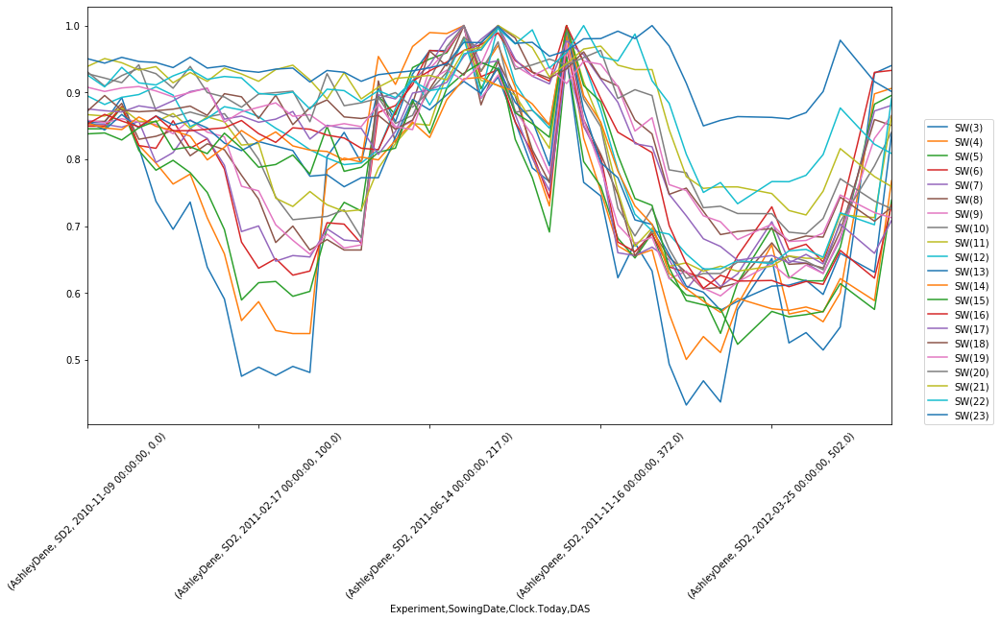

In [20]:
idx = pd.IndexSlice
df.loc[idx['AshleyDene','SD2',:,:],
               [X for X in cols[2:]]].\
plot(figsize=(15, 8),style='-')
plt.xticks( rotation=45)
plt.legend(loc=(1.04,0))

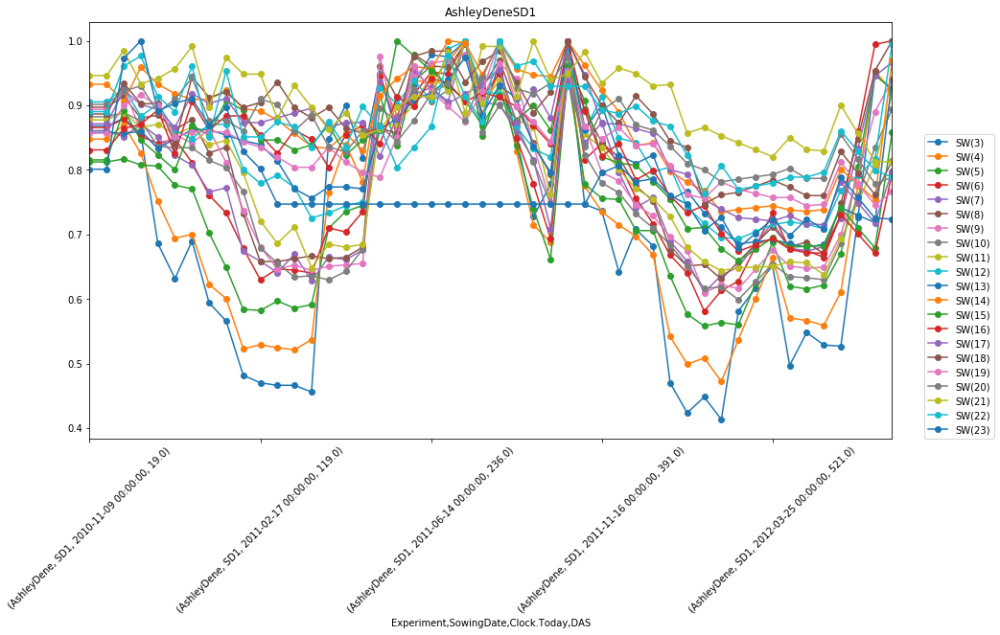

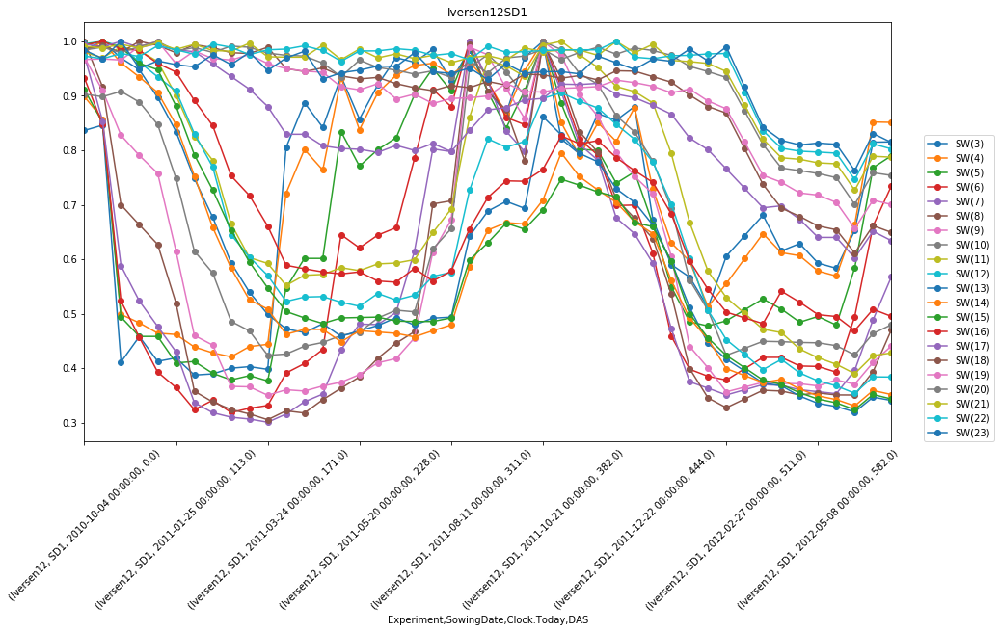

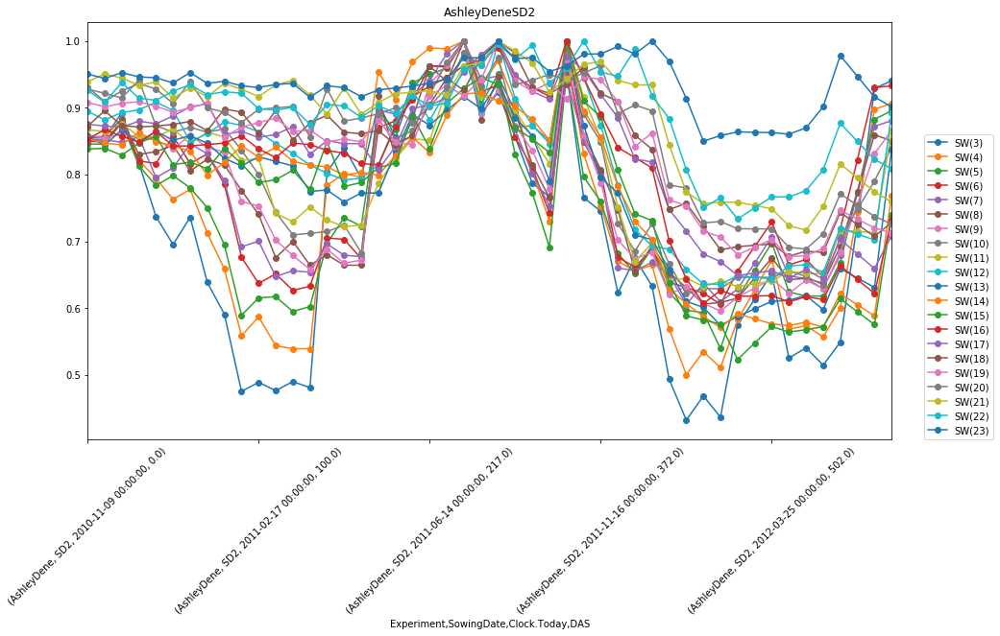

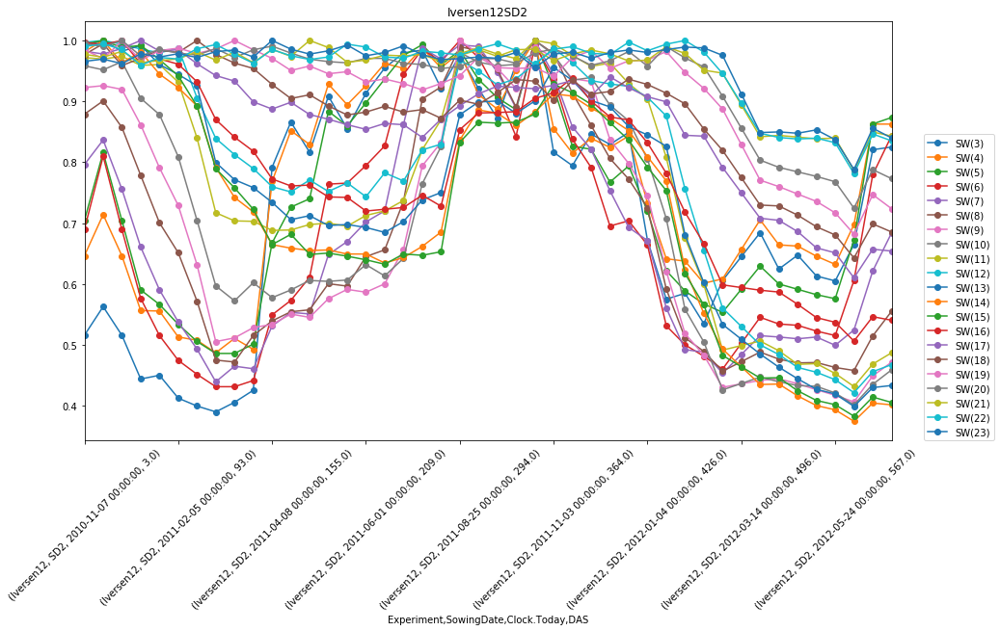

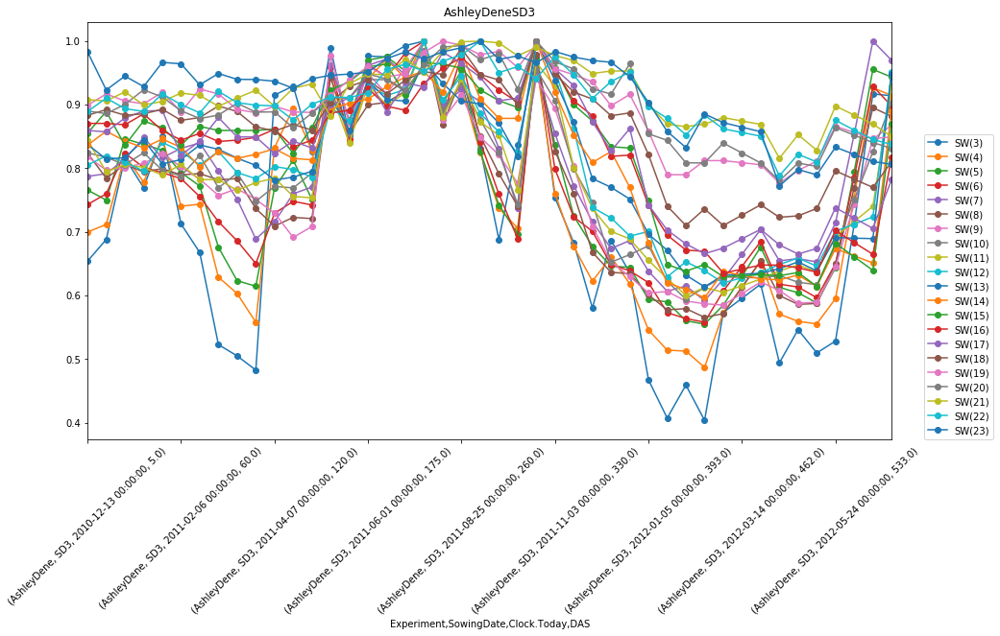

...

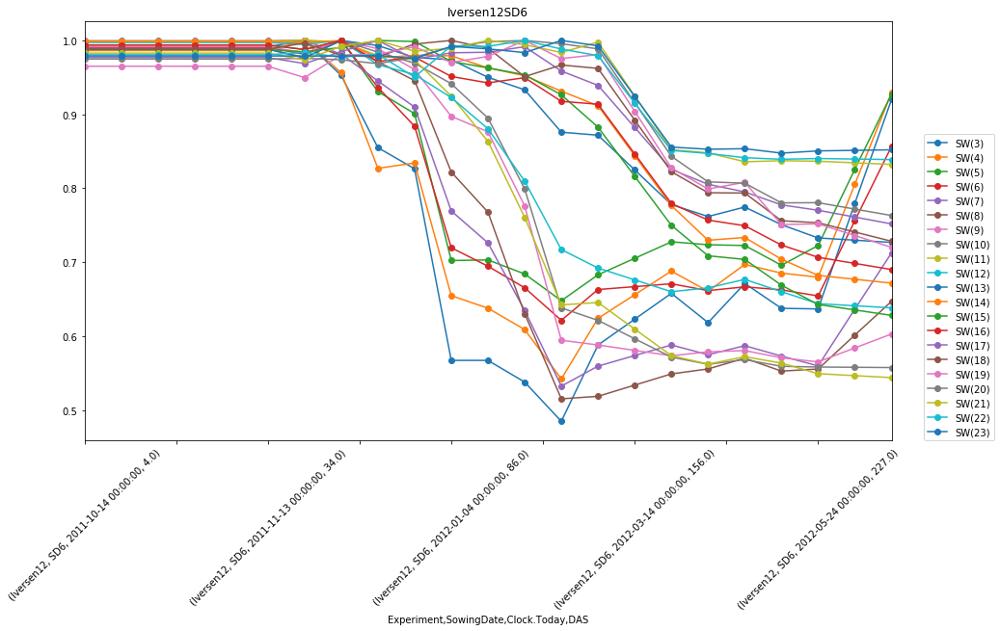

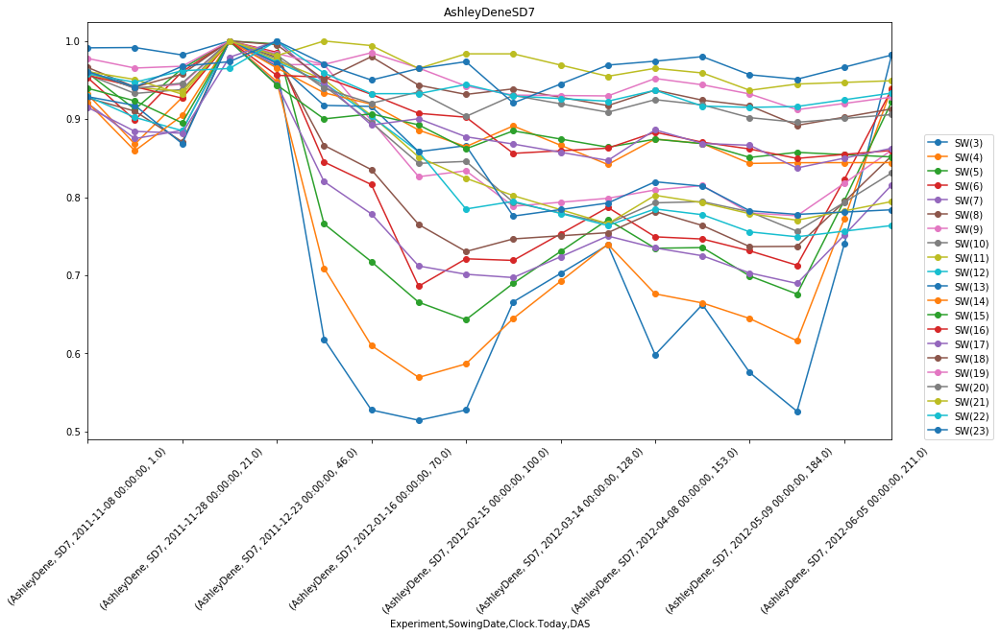

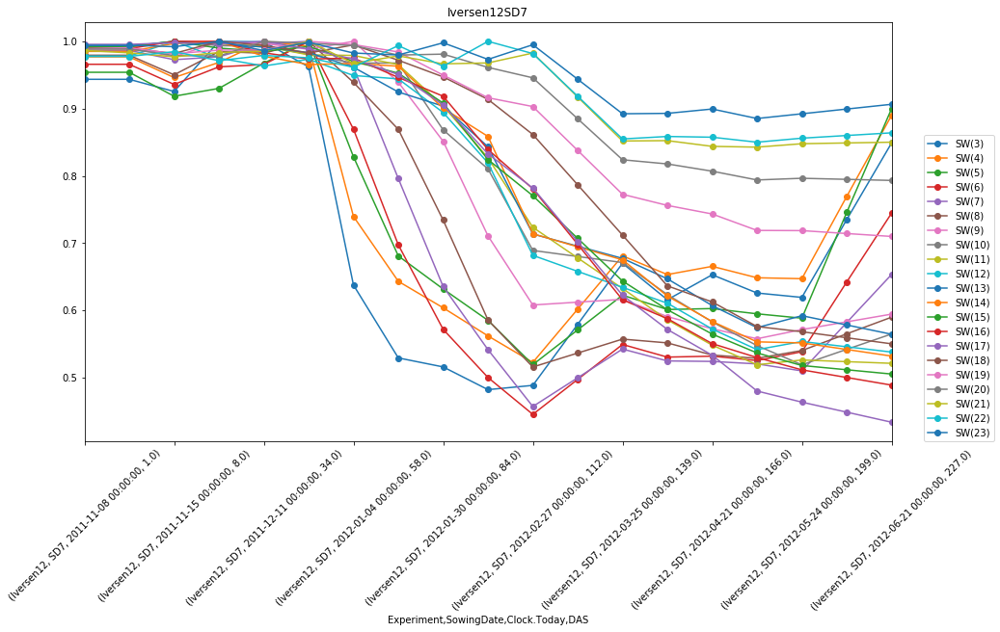

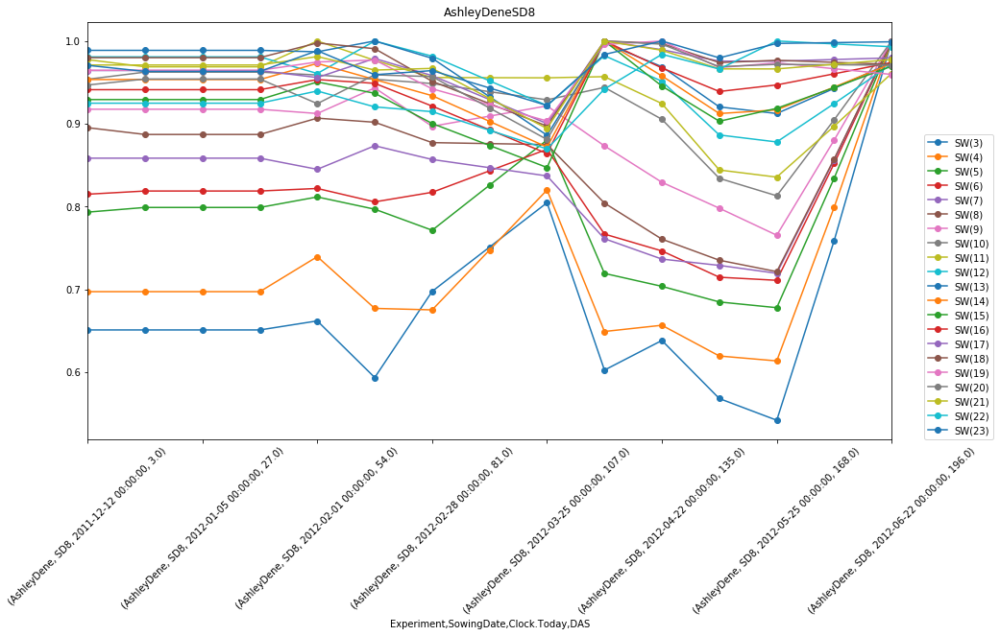

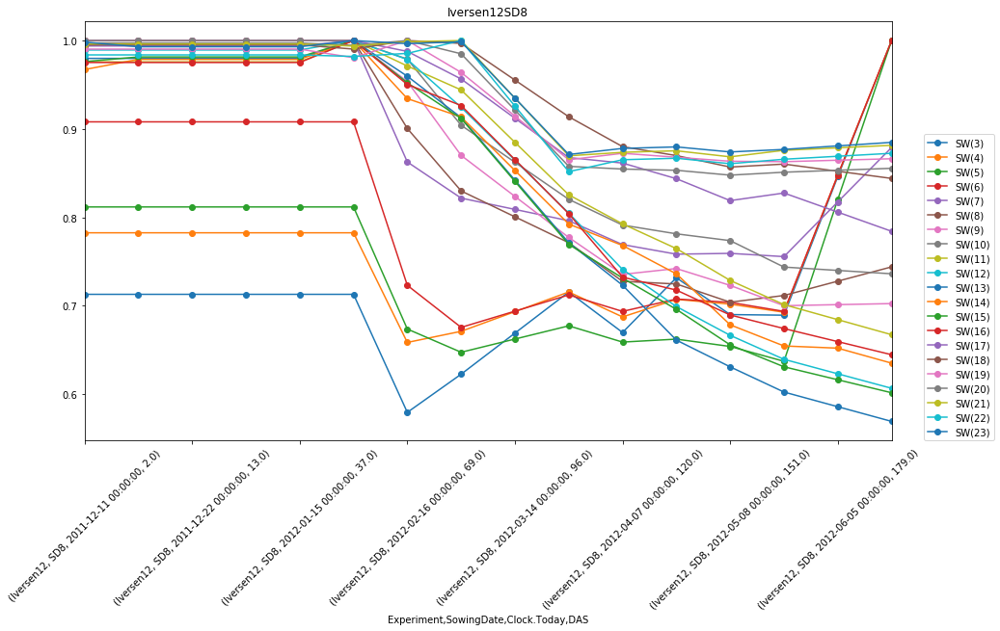

In [21]:
SDs = ['SD' + str(SD) for SD in range(1, 9)]
Sites = ['AshleyDene', 'Iversen12']
for i in SDs:
    for j in Sites:

        idx = pd.IndexSlice
        df.loc[idx[j,i,:],
                       [X for X in cols[2:]]].\
        plot(figsize=(15, 8),style='-o')
        plt.xticks( rotation=45)
        plt.legend(loc=(1.04,0)) 
        plt.title(j + i)

## How can I implement a 5% changes detection?

In [22]:
idx = pd.IndexSlice
test = df.loc[idx['AshleyDene','SD2',:],['SW(3)','SW(4)','SW(5)', 'SW(6)', 'SW(7)','SW(8)']]
# test

In [23]:
# test['delta'] = test['SW(3)'] -test['shift']

# test['RFVFront'] = test['delta'] < -0.05
# test[test['delta'] < 0]

(array([ 0., 10., 20., 30., 40., 50.]), <a list of 6 Text xticklabel objects>)

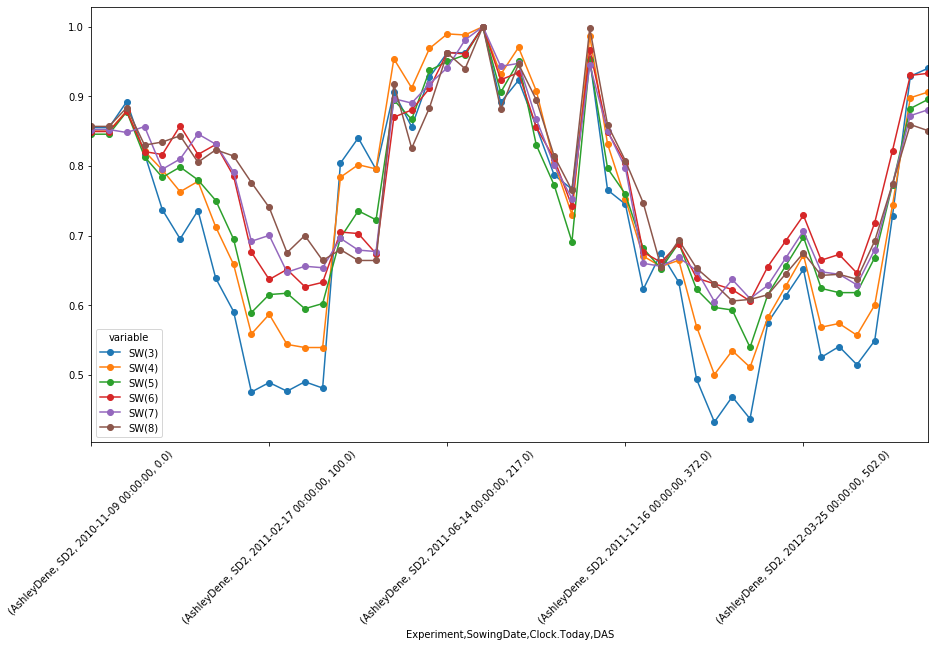

In [24]:
test.plot(figsize=(15, 8),style='o-')
plt.xticks( rotation=45)

## How many days after sown 

In [25]:
sowingdates = pd.read_sql('Select * from SowingDates',  con)
sowingdates.AD = pd.to_datetime(sowingdates.AD)
sowingdates.I12 = pd.to_datetime(sowingdates.I12)
# set index and rename columns 
# sowingdates.set_index('SD', inplace=True)
sowingdates.columns = ['SowingDate','AshleyDene', 'Iversen12']

In [27]:
# df_reindexed
# sowingdates

In [28]:
sowingdates_melted = sowingdates.melt(id_vars='SowingDate', var_name = 'Experiment', value_name='Clock.Today').\
set_index(['Experiment', 'SowingDate','Clock.Today'])

In [29]:
sowingdates_melted
df_reindexed = df.reset_index().set_index(['Experiment', 'SowingDate','Clock.Today'])

In [30]:
# check if merge happened
df_SD = df_reindexed.merge(sowingdates_melted, 
                           left_index=True, right_index=True, how='outer')
# df_SD = df_SD.reset_index().set_index(['Experiment', 'SowingDate'])


In [31]:
df_SD

DAS     SW(1)    SW(10)    SW(11)  \
Experiment SowingDate Clock.Today                                        
AshleyDene SD1        2010-10-21     NaN       NaN       NaN       NaN   
                      2010-11-09    19.0  0.754857  0.882353  0.877551   
                      2010-11-16    26.0  0.626272  0.882353  0.877551   
                      2010-11-24    34.0  0.633673  0.888889  0.888889   
                      2010-12-02    42.0  0.533765  0.875817  0.866213   
...                                  ...       ...       ...       ...   
Iversen12  SD9        2012-04-21   102.0  0.743777  0.889562  0.849352   
                      2012-05-08   119.0  0.613470  0.838206  0.824196   
                      2012-05-24   135.0  0.565154  0.835370  0.821179   
                      2012-06-05   147.0  0.757687  0.826280  0.811815   
                      2012-06-21   163.0  1.000000  0.817183  0.802439   

                                     SW(12)    SW(13)    SW(14)    SW(15)  \
Experiment SowingDate Clock.Today                                           
AshleyDene SD1        2010-10-21        NaN       NaN       NaN       NaN   
                      2010-11-09   0.905363  0.858166  0.932749  0.815562   
                      2010-11-16   0.905363  0.858166  0.932749  0.815562   
                      2010-11-24   0.927445  0.856734  0.906433  0.892411   
                      2010-12-02   0.883281  0.859599  0.959064  0.846302   
...                                     ...       ...       ...       ...   
Iversen12  SD9        2012-04-21   0.830054  0.807119  0.853641  0.852568   
                      2012-05-08   0.806393  0.785141  0.831508  0.831281   
                      2012-05-24   0.792638  0.760414  0.804025  0.802497   
                      2012-06-05   0.783537  0.751658  0.794439  0.792591   
                      2012-06-21   0.774428  0.742894  0.784841  0.782667   

                                     SW(16)    SW(17)  ...    SW(21)  \
Experiment SowingDate Clock.Today                      ...             
AshleyDene SD1        2010-10-21        NaN       NaN  ...       NaN   
                      2010-11-09   0.831063  0.871508  ...  0.946294   
                      2010-11-16   0.831063  0.871508  ...  0.946294   
                      2010-11-24   0.863760  0.923650  ...  0.984962   
                      2010-12-02   0.871026  0.901304  ...  0.933405   
...                                     ...       ...  ...       ...   
Iversen12  SD9        2012-04-21   0.839500  0.888924  ...  0.865387   
                      2012-05-08   0.813733  0.857643  ...  0.864841   
                      2012-05-24   0.807774  0.869438  ...  0.858074   
                      2012-06-05   0.800619  0.863938  ...  0.861732   
                      2012-06-21   0.793456  0.858429  ...  0.865384   

                                     SW(22)    SW(23)     SW(3)     SW(4)  \
Experiment SowingDate Clock.Today                                           
AshleyDene SD1        2010-10-21        NaN       NaN       NaN       NaN   
                      2010-11-09   0.890304  0.801105  0.868217  0.847861   
                      2010-11-16   0.890304  0.801105  0.868217  0.847861   
                      2010-11-24   0.960823  0.972801  0.879845  0.870048   
                      2010-12-02   0.976494  1.000000  0.856589  0.825674   
...                                     ...       ...       ...       ...   
Iversen12  SD9        2012-04-21   0.853201  0.880576  0.741134  0.749745   
                      2012-05-08   0.848769  0.871912  0.723617  0.737411   
                      2012-05-24   0.846506  0.874207  0.713074  0.729233   
                      2012-06-05   0.849307  0.876246  0.806305  0.826501   
                      2012-06-21   0.852104  0.878281  0.898317  0.922646   

                                      SW(5)     SW(6)     SW(7)     SW(8)  \
Experiment SowingDate Clock.Today                       

In [32]:
# df_SD['DAS']  = (df_SD['Clock.Today'] - df_SD['Clock.TodayStart']).map(lambda x: x.days)
# df_SD[['DAS']]


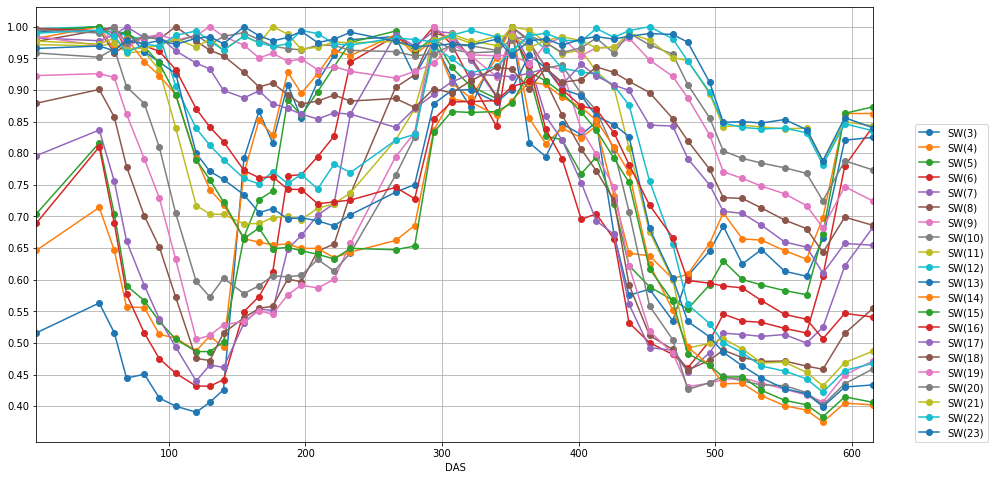

In [70]:
df_SD.loc['Iversen12','SD2'].reset_index().\
set_index('DAS').loc[:, [x for x in cols[2:]]].\
plot(figsize=(15, 8),style='-o', grid=True)
plt.yticks(np.arange(0.4, 1.05, 0.05))
plt.legend(loc = (1.05,0))

In [73]:
long = df_SD.reset_index().\
melt(id_vars= ['Experiment','SowingDate','Clock.Today','DAS'], 
     value_vars=cols, var_name='layer', value_name='relSW')
long['shift']= long.groupby(['Experiment','SowingDate', 'layer'])['relSW'].shift(3)
# long['delta'] = long['relSW'] - long['relSW'].shift(1)
long['delta'] = long['relSW'] - long['shift']
long = long.assign(col = ['NaN' if pd.isnull(a) else 'pos' if a > 0 else 'neg' for a in long['delta']])

In [75]:
# Select out the detla has a detla smaller/equal than -0.05
# long[(long['delta'] <= 0) | (long['delta'].isnull())]
# Checking if the calculation is correct 
long[(long['Experiment'] =='Iversen12') & (long['SowingDate'] =='SD2') ]

,Experiment,SowingDate,Clock.Today,DAS,layer,relSW,shift,delta,col
357,Iversen12,SD2,2010-11-04,NaN,SW(1),NaN,NaN,NaN,NaN
358,Iversen12,SD2,2010-11-07,3.0,SW(1),1.000000,NaN,NaN,NaN
359,Iversen12,SD2,2010-12-23,49.0,SW(1),0.314913,NaN,NaN,NaN
360,Iversen12,SD2,2011-01-03,60.0,SW(1),0.374834,NaN,NaN,NaN
361,Iversen12,SD2,2011-01-12,69.0,SW(1),0.292277,1.000000,-0.707723,neg
362,Iversen12,SD2,2011-01-25,82.0,SW(1),0.370173,0.314913,0.055260,pos
363,Iversen12,SD2,2011-02-05,93.0,SW(1),0.245007,0.374834,-0.129827,neg
364,Iversen12,SD2,2011-02-17,105.0,SW(1),0.310253,0.292277,0.017976,pos
365,Iversen12,SD2,2011-03-04,120.0,SW(1),0.274301,0.370173,-0.095872,neg
366,Iversen12,SD2,2011-03-14,130.0,SW(1),0.320240,0.245007,0.075233,pos


In [ ]:
long.pivot_table(values='delta', index=['Experiment','SowingDate', 'layer'], 
                       columns = ['Clock.Today','DAS','col'])

In [65]:
firstday_decrease = long[((long['delta'] < -0.05) | (long['delta'].isnull())) &
                         (long['Clock.Today']  < '2011-06-22')].\
groupby(['Experiment','SowingDate','layer','col']).head(n = 2)
pd.set_option("display.max_rows", 1500)
firstday_decrease
# firstday_decrease.groupby(['Experiment','SowingDate']).count()


# test = long.\
# pivot_table(values='delta', index=['Experiment','SowingDate', 'Clock.Today','DAS'], 
#                        columns=['col','layer'])
# pd.set_option("display.max_column", 300)
# test
# long[(long['Experiment'] == 'Iversen12') & 
#      (long['SowingDate'] == 'SD1') & 
#      (long['layer'] == 'SW(3)') ]

,Experiment,SowingDate,Clock.Today,DAS,layer,relSW,shift,delta,col
0,AshleyDene,SD1,2010-10-21,NaN,SW(1),NaN,NaN,NaN,NaN
1,AshleyDene,SD1,2010-11-09,19.0,SW(1),0.754857,NaN,NaN,NaN
2,AshleyDene,SD1,2010-11-16,26.0,SW(1),0.626272,0.754857,-0.128585,neg
3,AshleyDene,SD1,2010-11-24,34.0,SW(1),0.633673,0.626272,0.007401,pos
4,AshleyDene,SD1,2010-12-02,42.0,SW(1),0.533765,0.633673,-0.099907,neg
...,...,...,...,...,...,...,...,...,...
13795,Iversen12,SD9,2012-04-21,102.0,SW(23),0.880576,0.873042,0.007534,pos
13796,Iversen12,SD9,2012-05-08,119.0,SW(23),0.871912,0.880576,-0.008664,neg
13797,Iversen12,SD9,2012-05-24,135.0,SW(23),0.874207,0.871912,0.002295,pos
13798,Iversen12,SD9,2012-06-05,147.0,SW(23),0.876246,0.874207,0.002038,pos


In [36]:
filtered = long[(long['delta'] <= -0.05) | (long['delta'].isnull())].\
pivot_table(values='delta', index=['Experiment','SowingDate', 'Clock.Today','DAS'], 
                       columns='layer')

## I only need to first season to figure out where the root are?

## The crop has been cut in 21th and 22th Aug 2011 to ground level in AshleyDene and Iversen12 repectively. these two dates can be the first year end point

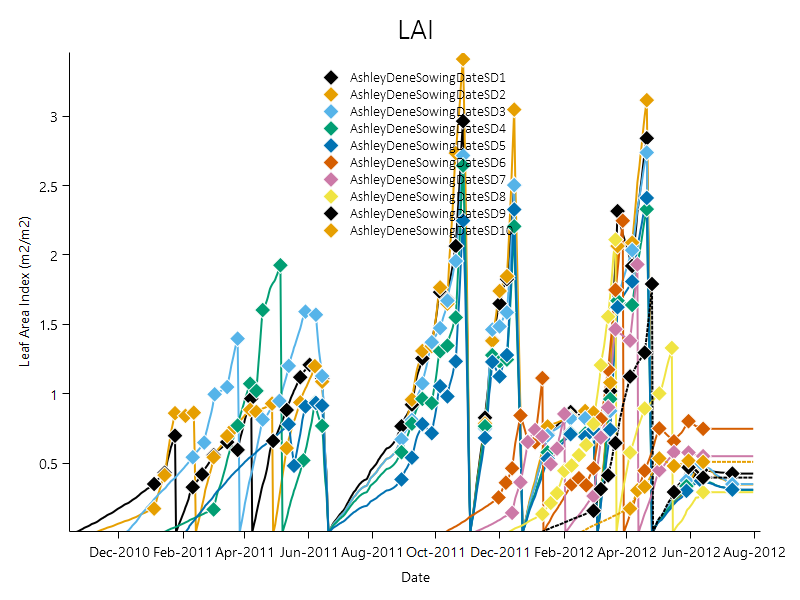

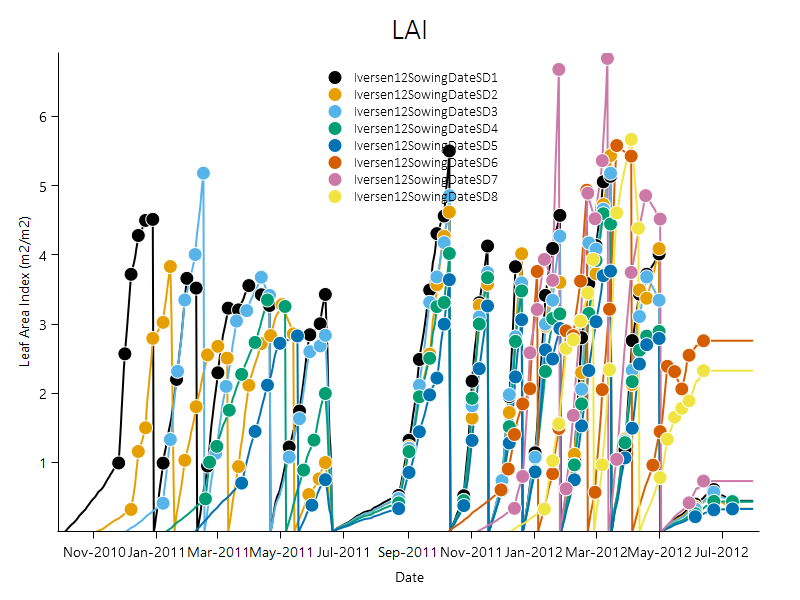

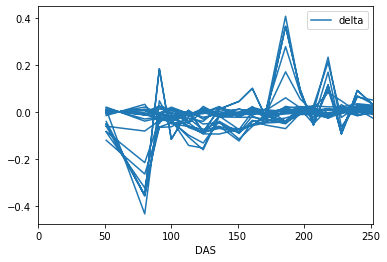

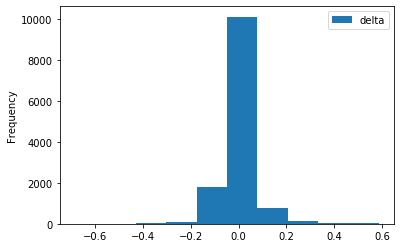

In [46]:
# First season
long[(long['Clock.Today'] < "2011-06-23") & 
     (long['Experiment'] == 'Iversen12') & 
     (long['SowingDate'] == 'SD1') ].plot('DAS', 'delta')
long.plot('DAS', 'delta', kind = 'hist')

Clearly the SD5 in AD had no possiblity to evidence that the RFV had gone down to the deeper layer sicne there is a big rainfall refilled every layer. 

In [ ]:
firstday_decrease.\
pivot_table(values='delta', index=['Experiment','SowingDate', 'Clock.Today','DAS'], 
                       columns='layer').reset_index().\
set_index('DAS')

In [ ]:
df_SD.loc['AshleyDene','SD5'].reset_index().\
set_index('DAS').loc[:, [x for x in cols[2:]]].\
plot(figsize=(15, 8),style='-', grid=True)
plt.yticks(np.arange(0.4, 1.05, 0.05))
plt.legend(loc = (1.05,0))

In [ ]:
filtered.loc['Iversen12','SD2'].reset_index().\
set_index('DAS').loc[:, [x for x in cols[2:]]].\
plot(figsize=(15, 8),style='-o', grid=True)
# plt.yticks(np.arange(0.4, 1.05, 0.05))
plt.legend(loc = (1.05,0))

In [ ]:
[x for x in range(0,10, 1)]

In [ ]:
LONG = df_SD.stack(dropna=False).to_frame(name = 'relSW').\
reset_index().set_index(['Experiment', 'SowingDate', 'level_3','Clock.Today']).\
sort_values(['Experiment','SowingDate','level_3','Clock.Today'])

# LONG['delta'] = LONG['relSW'] - LONG['relSW'].shift(1)
# test = LONG[(LONG['delta'] < -0.05) |( np.isnan(LONG['delta']))]
# pivot_table(values=['relSW','delta'], 
#             index=['Experiment','SowingDate', 'Clock.Today'], 
#             columns = ['level_3'])
# test
LONG

## I need a water balance?? 

Recipe:  
1. Climate data to calculate daily PET
2. Climate data to calculate cummulative rainfall   
3. 

$SoilWaterExtraction = min(Transpiration supply, Demand)$

$Demand = PET$

$Soil evaporation = first layer water usage * (1 - canopy cover)$

## Talked with Rog. water balance is not necessary
**The only date I need for the RFV is the date which the curvy started to decline**

In [ ]:
water_mean.drop(columns=['Rep', 'Plot']).reset_index()

In [ ]:
test.loc[idx['AshleyDene','SD2',:]].plot(figsize=(15, 8),style='o-')
plt.xticks( rotation=45)

In [ ]:
# df_SD = df.merge(sowingdates_melted, left_index=True, right_index=True, how='outer')
# test = df_SD.loc[idx['AshleyDene','SD1',:],['SW(3)','SW(4)','SW(5)', 'SW(6)', 'SW(7)',
#                                         'SW(8)', 'SW(9)','SW(10)', 'SW(11)', 'SW(12)',
#                                         'SW(13)','SW(14)', 'SW(15)', 'SW(16)','SW(17)','SW(18)']]
# test.plot(figsize=(15, 8),style='o-')
# plt.xticks( rotation=45)

## Read OPTIMISED RFV AND KL

In [ ]:
optimisedKLRFV = pd.read_excel("../../03processed-data/LayerByLayberRFVandKL.xlsx")
# optimisedKLRFV.set_index('names', inplace = True)

In [ ]:
optimisedKLRFV.axes

In [ ]:
idx = pd.IndexSlice

optimisedKLRFV.loc[idx["AshleyDeneSD2"],:].\
plot( 'KL', 'layer',figsize=(15, 8),style='-')
optimisedKLRFV.loc[idx["AshleyDeneSD3"],:].\
plot( 'KL', 'layer',figsize=(15, 8),style='-')
plt.legend()
plt.xlim(0, 0.15)